In [3]:
import os
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np

# Load audio files with librosa

In [4]:
BASE_DIR = "/Users/kristineumeh/Desktop/projects/MIR/AudioSignalProcessing/"

scale_file = "audio5/scale.wav"
debussy_file = "audio3/debussy.wav"
redhot_file = "audio3/redhot.wav"
duke_file = "audio3/duke.wav"

In [5]:
ipd.Audio(os.path.join(BASE_DIR, scale_file))

In [6]:
ipd.Audio(os.path.join(BASE_DIR, debussy_file))

In [7]:
ipd.Audio(os.path.join(BASE_DIR, redhot_file))

In [8]:
ipd.Audio(os.path.join(BASE_DIR, duke_file))

In [9]:
scale, sr = librosa.load(os.path.join(BASE_DIR, scale_file))
debussy, sr = librosa.load(os.path.join(BASE_DIR, debussy_file))
redhot, sr = librosa.load(os.path.join(BASE_DIR, redhot_file))
duke, sr = librosa.load(os.path.join(BASE_DIR, duke_file))


# Extracting Short Term Fourier Transform

In [11]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [13]:
S_scale = librosa.stft(scale, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [14]:
S_scale.shape
# gives us frequency bins which is (frame_size / 2) + 1 as well as the number of bins

(1025, 342)

In [16]:
# complex fourier coefficients
type(S_scale[0][0])

numpy.complex64

# Calculate the Spectrogram

In [17]:
# squared magnitude of stft

Y_scale = np.abs(S_scale) ** 2

In [18]:
Y_scale.shape

(1025, 342)

In [19]:
# now float values 
type(Y_scale[0][0])

numpy.float32

# Visualise the spectrogram

In [34]:
def plot_spectrogram(Y, sr, hop_length, y_axis='linear'):
    plt.figure(figsize=(25,10))
    librosa.display.specshow(
        Y, 
        sr=sr,
        hop_length=hop_length,
        x_axis= 'time',
        y_axis=y_axis
    )
    plt.colorbar(format="%+2.f")

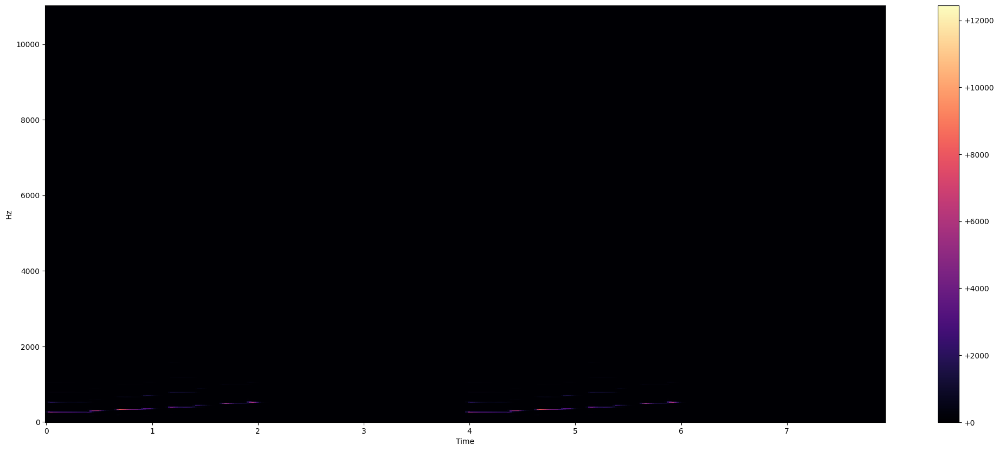

In [35]:
plot_spectrogram(Y_scale, sr, HOP_SIZE)

# Log Amplitude Spectrogram

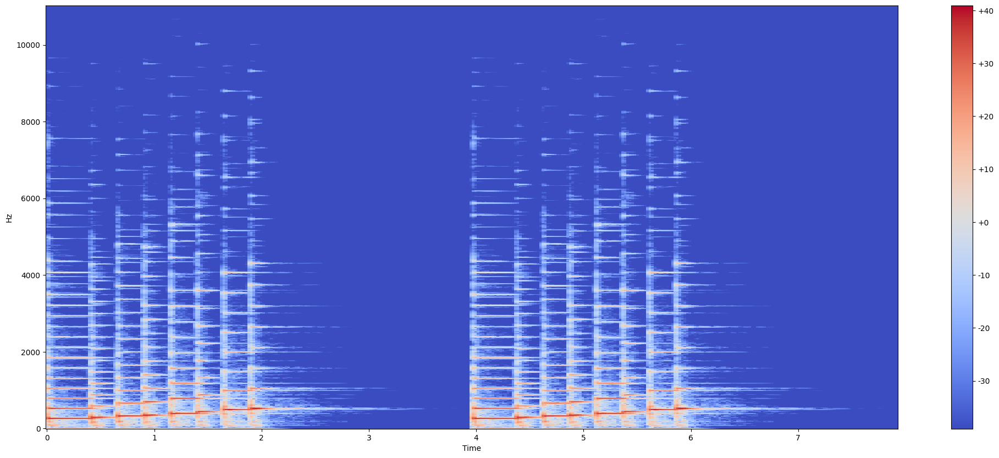

In [37]:
# applying logrithmic transformation (log / amp spec)
Y_log_scale = librosa.power_to_db(Y_scale)
plot_spectrogram(Y_log_scale, sr, HOP_SIZE)

# Log frequency Spectrogram

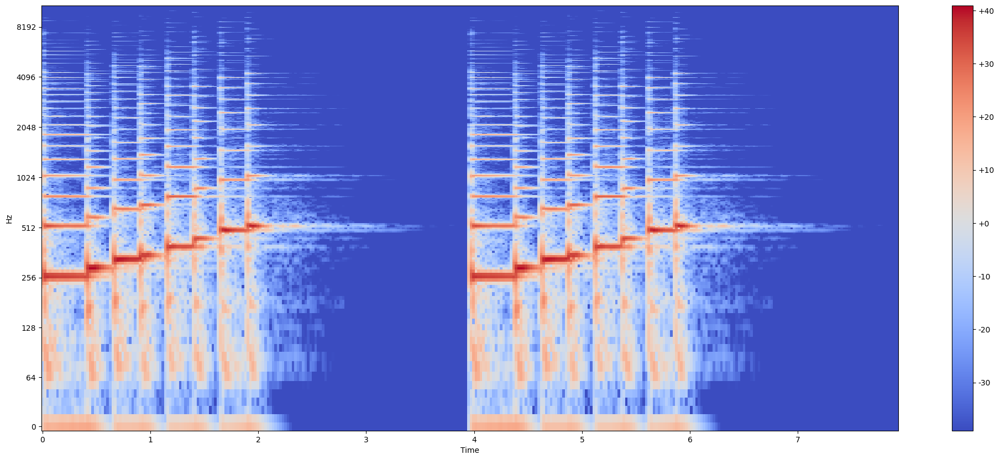

In [38]:
plot_spectrogram(Y_log_scale, sr, HOP_SIZE, y_axis="log")

# Visualising songs from different genres

Text(0.5, 1.0, 'Duke Ellington: Jazz')

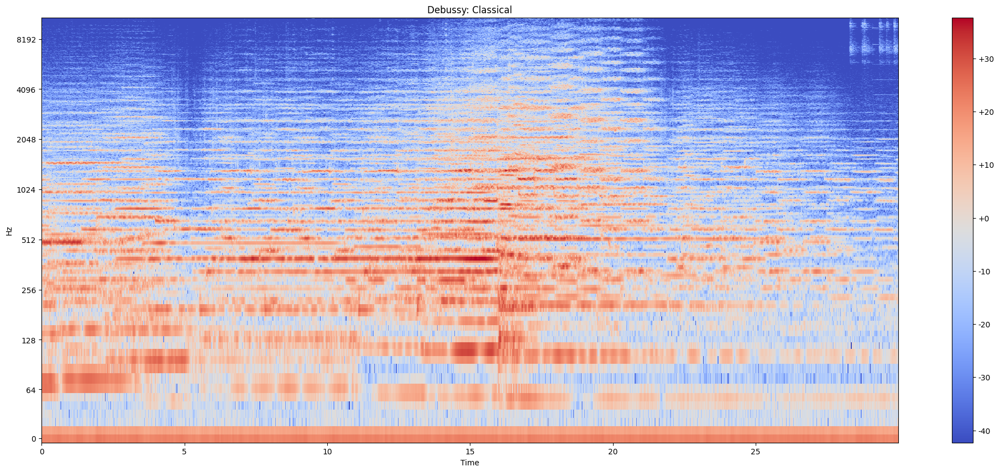

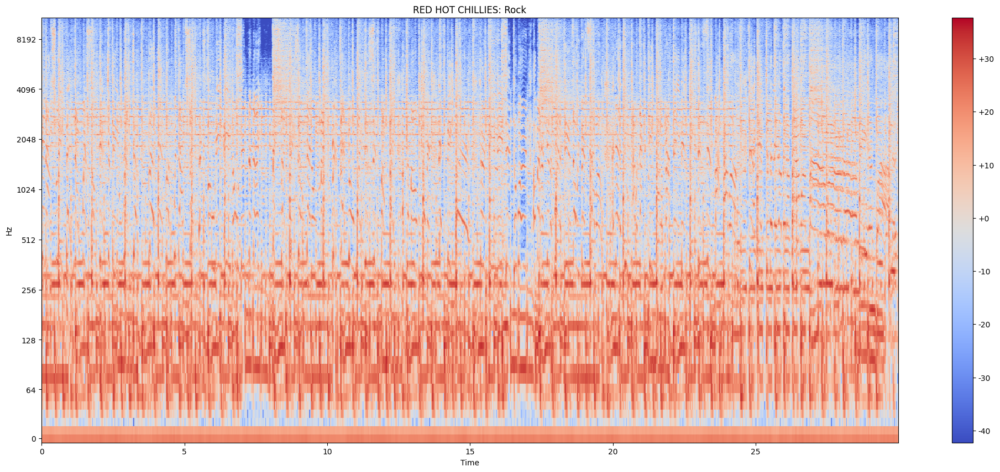

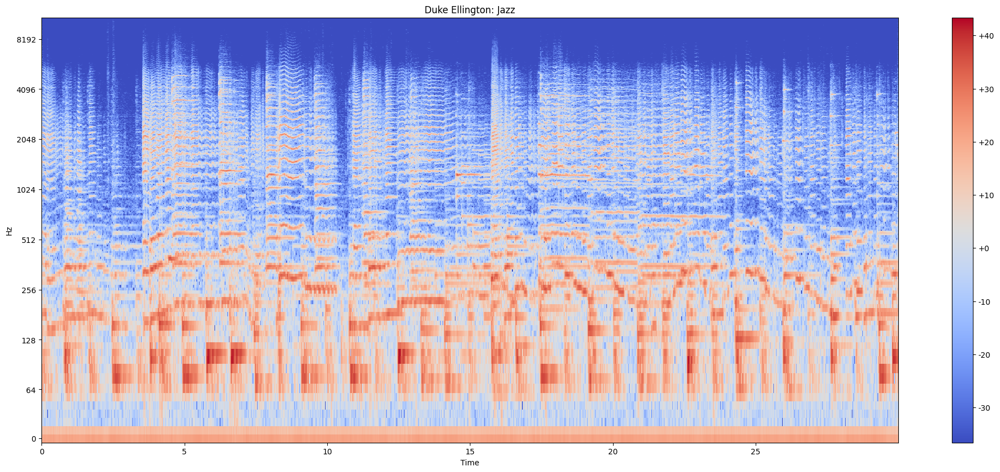

In [42]:

S_debussy = librosa.stft(debussy, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_redhot = librosa.stft(redhot, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_duke = librosa.stft(duke, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

Y_debussy = librosa.power_to_db(np.abs(S_debussy) ** 2)
Y_redhot = librosa.power_to_db(np.abs(S_redhot) ** 2)
Y_duke = librosa.power_to_db(np.abs(S_duke) ** 2)

plot_spectrogram(Y_debussy, sr, HOP_SIZE, y_axis="log")
plt.title("Debussy: Classical")
plot_spectrogram(Y_redhot, sr, HOP_SIZE, y_axis="log")
plt.title("RED HOT CHILLIES: Rock")
plot_spectrogram(Y_duke, sr, HOP_SIZE, y_axis="log")
plt.title("Duke Ellington: Jazz")